In [32]:
import pandas as pd
import numpy as np
import plotly.express as px

In [33]:
I = pd.read_csv('interactions.csv')
I.head()

,user_id,recipe_id,date,rating,review
0,38094,40893,2003-02-17,4,Great with a salad. Cooked on top of stove for...
1,1293707,40893,2011-12-21,5,"So simple, so delicious! Great for chilly fall..."
2,8937,44394,2002-12-01,4,This worked very well and is EASY. I used not...
3,126440,85009,2010-02-27,5,I made the Mexican topping and took it to bunk...
4,57222,85009,2011-10-01,5,"Made the cheddar bacon topping, adding a sprin..."


In [34]:
I.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1132367 entries, 0 to 1132366
Data columns (total 5 columns):
 #   Column     Non-Null Count    Dtype 
---  ------     --------------    ----- 
 0   user_id    1132367 non-null  int64 
 1   recipe_id  1132367 non-null  int64 
 2   date       1132367 non-null  object
 3   rating     1132367 non-null  int64 
 4   review     1132198 non-null  object
dtypes: int64(3), object(2)
memory usage: 43.2+ MB


In [35]:
px.bar(I.rating.value_counts())

In [36]:
I = I.drop(columns=['user_id', 'date'])

#### Nutrition information =  calories (#), total fat (PDV), sugar (PDV) , sodium (PDV) , protein (PDV) , saturated fat
#### recipes - id = recipe_id

In [37]:
R = pd.read_csv('recipes.csv')
R.head()

,name,id,minutes,contributor_id,submitted,tags,nutrition,n_steps,steps,description,ingredients,n_ingredients
0,arriba baked winter squash mexican style,137739,55,47892,2005-09-16,"['60-minutes-or-less', 'time-to-make', 'course...","[51.5, 0.0, 13.0, 0.0, 2.0, 0.0, 4.0]",11,"['make a choice and proceed with recipe', 'dep...",autumn is my favorite time of year to cook! th...,"['winter squash', 'mexican seasoning', 'mixed ...",7
1,a bit different breakfast pizza,31490,30,26278,2002-06-17,"['30-minutes-or-less', 'time-to-make', 'course...","[173.4, 18.0, 0.0, 17.0, 22.0, 35.0, 1.0]",9,"['preheat oven to 425 degrees f', 'press dough...",this recipe calls for the crust to be prebaked...,"['prepared pizza crust', 'sausage patty', 'egg...",6
2,all in the kitchen chili,112140,130,196586,2005-02-25,"['time-to-make', 'course', 'preparation', 'mai...","[269.8, 22.0, 32.0, 48.0, 39.0, 27.0, 5.0]",6,"['brown ground beef in large pot', 'add choppe...",this modified version of 'mom's' chili was a h...,"['ground beef', 'yellow onions', 'diced tomato...",13
3,alouette potatoes,59389,45,68585,2003-04-14,"['60-minutes-or-less', 'time-to-make', 'course...","[368.1, 17.0, 10.0, 2.0, 14.0, 8.0, 20.0]",11,['place potatoes in a large pot of lightly sal...,"this is a super easy, great tasting, make ahea...","['spreadable cheese with garlic and herbs', 'n...",11
4,amish tomato ketchup for canning,44061,190,41706,2002-10-25,"['weeknight', 'time-to-make', 'course', 'main-...","[352.9, 1.0, 337.0, 23.0, 3.0, 0.0, 28.0]",5,['mix all ingredients& boil for 2 1 / 2 hours ...,my dh's amish mother raised him on this recipe...,"['tomato juice', 'apple cider vinegar', 'sugar...",8


In [38]:
R.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 231637 entries, 0 to 231636
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   name            231636 non-null  object
 1   id              231637 non-null  int64 
 2   minutes         231637 non-null  int64 
 3   contributor_id  231637 non-null  int64 
 4   submitted       231637 non-null  object
 5   tags            231637 non-null  object
 6   nutrition       231637 non-null  object
 7   n_steps         231637 non-null  int64 
 8   steps           231637 non-null  object
 9   description     226658 non-null  object
 10  ingredients     231637 non-null  object
 11  n_ingredients   231637 non-null  int64 
dtypes: int64(5), object(7)
memory usage: 21.2+ MB


In [39]:
R.describe()

,id,minutes,contributor_id,n_steps,n_ingredients
count,231637.000000,2.316370e+05,2.316370e+05,231637.000000,231637.000000
mean,222014.708984,9.398546e+03,5.534885e+06,9.765499,9.051153
std,141206.635626,4.461963e+06,9.979141e+07,5.995128,3.734796
min,38.000000,0.000000e+00,2.700000e+01,0.000000,1.000000
25%,99944.000000,2.000000e+01,5.690500e+04,6.000000,6.000000
50%,207249.000000,4.000000e+01,1.736140e+05,9.000000,9.000000
75%,333816.000000,6.500000e+01,3.982750e+05,12.000000,11.000000
max,537716.000000,2.147484e+09,2.002290e+09,145.000000,43.000000


In [40]:
px.histogram(R.n_steps, labels={'value': 'Number of Cooking Steps'})

In [41]:
px.histogram(R.n_ingredients, labels={'value': 'Number of ingredients'})

In [42]:
R['minutes'] = R.minutes.clip(0, 500)
px.histogram(R.minutes, labels={'value': 'Cooking Time'})

In [43]:
import ast
R['nutrition'] = R['nutrition'].apply(lambda x: ast.literal_eval(x))
# R['ingredients'] = R['ingredients'].apply(lambda x: ast.literal_eval(x))
# R['steps'] = R['steps'].apply(lambda x: ast.literal_eval(x))

In [44]:
R['calories'] = R['nutrition'].apply(lambda x: x[0])
R['calories'] = R.calories.clip(0, 3000)

In [45]:
px.histogram(R.calories, labels={'value': 'Calories'})

In [46]:
ingredients = ''.join(x for x in R['ingredients']).split(',')

In [47]:
from nltk.probability import FreqDist
ingre_dist = FreqDist(ingredients)
ing_key = list(ingre_dist.keys())

In [48]:
ing_freq = []
for key in ing_key:
    ing_freq.append((key,ingre_dist[key]))

ing_freq_sorted = sorted(ing_freq,key = lambda x: x[1],reverse = True)

In [49]:
df_ing = pd.DataFrame(ing_freq_sorted[:20], columns =['Ingredients', 'Freq']) 
df_ing = df_ing.replace("'", '', regex=True)
df_ing.head()

,Ingredients,Freq
0,salt,78127
1,butter,38862
2,sugar,38756
3,onion,35739
4,eggs,28726


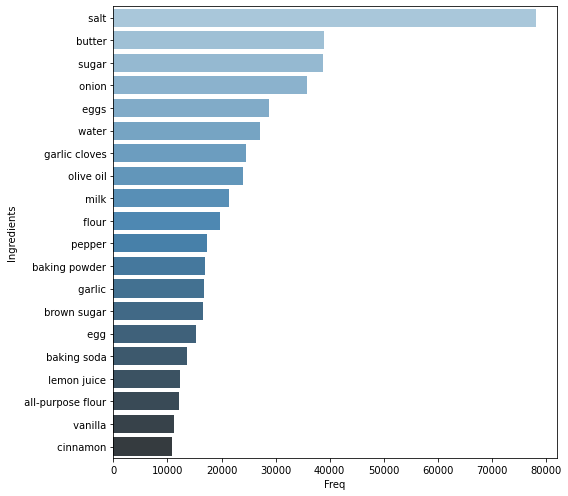

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt
f, ax = plt.subplots(figsize=(8, 7))
sns.barplot(x="Freq", y="Ingredients", data=df_ing, palette="Blues_d")
plt.tight_layout()

### Final data merged (need further nltk cleanning)

In [51]:
data = R.merge(I, how='left', left_on='id', right_on='recipe_id')

In [52]:
data = data.drop(columns=['contributor_id', 'submitted', 'nutrition', 'description', 'review', 'tags', 'id', 'minutes'])

In [53]:
data.head()

,name,n_steps,steps,ingredients,n_ingredients,calories,recipe_id,rating
0,arriba baked winter squash mexican style,11,"['make a choice and proceed with recipe', 'dep...","['winter squash', 'mexican seasoning', 'mixed ...",7,51.5,137739,5
1,arriba baked winter squash mexican style,11,"['make a choice and proceed with recipe', 'dep...","['winter squash', 'mexican seasoning', 'mixed ...",7,51.5,137739,5
2,arriba baked winter squash mexican style,11,"['make a choice and proceed with recipe', 'dep...","['winter squash', 'mexican seasoning', 'mixed ...",7,51.5,137739,5
3,a bit different breakfast pizza,9,"['preheat oven to 425 degrees f', 'press dough...","['prepared pizza crust', 'sausage patty', 'egg...",6,173.4,31490,0
4,a bit different breakfast pizza,9,"['preheat oven to 425 degrees f', 'press dough...","['prepared pizza crust', 'sausage patty', 'egg...",6,173.4,31490,5


In [54]:
# data.groupby('id').size()
# 231637 recipes in total
data.dropna(inplace=True)

In [55]:
data.isna().sum()

name             0
n_steps          0
steps            0
ingredients      0
n_ingredients    0
calories         0
recipe_id        0
rating           0
dtype: int64

In [56]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1132366 entries, 0 to 1132366
Data columns (total 8 columns):
 #   Column         Non-Null Count    Dtype  
---  ------         --------------    -----  
 0   name           1132366 non-null  object 
 1   n_steps        1132366 non-null  int64  
 2   steps          1132366 non-null  object 
 3   ingredients    1132366 non-null  object 
 4   n_ingredients  1132366 non-null  int64  
 5   calories       1132366 non-null  float64
 6   recipe_id      1132366 non-null  int64  
 7   rating         1132366 non-null  int64  
dtypes: float64(1), int64(4), object(3)
memory usage: 77.8+ MB


In [57]:
popular = data.groupby('name')['rating'].count().sort_values(ascending=False).reset_index()

In [58]:
popular.columns=['Recipe Name', 'Rating Freq']
popular.head(10)

,Recipe Name,Rating Freq
0,best banana bread,1614
1,to die for crock pot roast,1601
2,crock pot chicken with black beans cream cheese,1579
3,creamy cajun chicken pasta,1448
4,best ever banana cake with cream cheese frosting,1322
5,yes virginia there is a great meatloaf,1305
6,jo mama s world famous spaghetti,1234
7,whatever floats your boat brownies,1220
8,kittencal s italian melt in your mouth meatballs,997
9,japanese mum s chicken,904


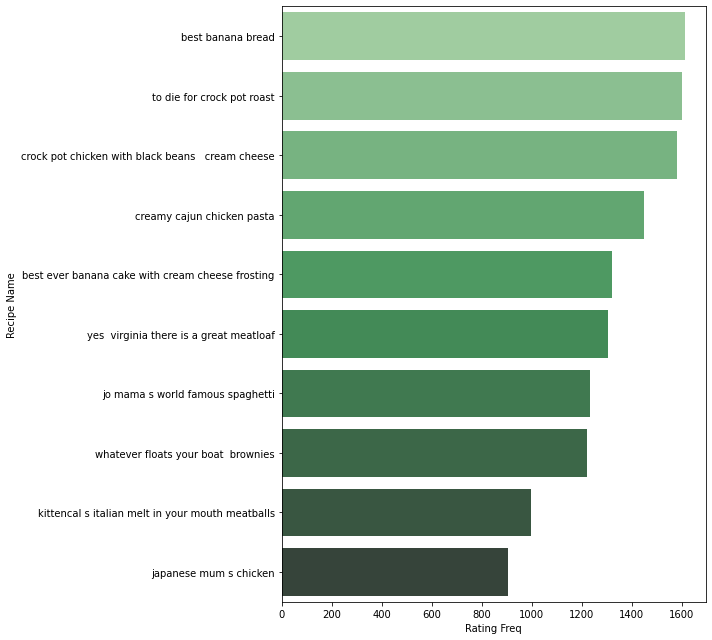

In [59]:
f, ax = plt.subplots(figsize=(10, 9))
sns.barplot(x="Rating Freq", y="Recipe Name", data=popular[:10], palette="Greens_d")
plt.tight_layout()

In [60]:
high_rating = data.groupby('name')['rating'].mean().sort_values(ascending=False).reset_index()
high_rating.head(10)

,name,rating
0,zydeco ya ya deviled eggs,5.0
1,idaho potato cake,5.0
2,ila s mustard cauliflower,5.0
3,ila s iced tequila,5.0
4,ila s fruit dip,5.0
5,ila s freckled pecans,5.0
6,ila s coleslaw,5.0
7,ila s apple crisp,5.0
8,ila bert and dylan s cashew chicken,5.0
9,il linguine la salsa di pesto con frutta del...,5.0


In [61]:
data.to_csv('final_data.csv')